date     0
 pm25    0
 pm10    0
 o3      0
 no2     0
 so2     0
 co      0
dtype: int64
           date        pm25    pm10    o3   no2        so2       co  \
0    2023-10-01  149.000000  115.00   8.0  13.0   1.000000   8.0000   
1    2023-10-02  142.000000  132.00   6.0  16.0   1.000000  10.0000   
2    2023-10-03  139.000000  149.00   8.0  18.0   1.000000  11.0000   
3    2023-10-04  145.000000  143.00   7.0  17.0   1.000000  10.0000   
4    2023-10-05  159.000000  137.00   5.0  17.0   1.000000  10.0000   
...         ...         ...     ...   ...   ...        ...      ...   
2097 2018-06-02  149.678571   87.00  56.0  11.0  10.000000   7.0000   
2098 2017-12-31  180.200000  212.00  37.0  14.0   5.688589  11.5776   
2099 2017-11-06  209.210526  280.00  12.0   7.0   5.688589  11.5776   
2100 2017-11-13  209.210526  189.00  29.0  21.0   5.688589  11.5776   
2101 2020-05-10  118.833333   83.25  49.0  10.0   5.688589   6.0000   

             AQI  
0     149.000000  
1     142.000000  


/var/folders/t2/q9fs839s4l96y0sbpzp96jr40000gn/T/ipykernel_67229/2901192432.py:38: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('6_month_group').apply(fill_nan_with_mean)


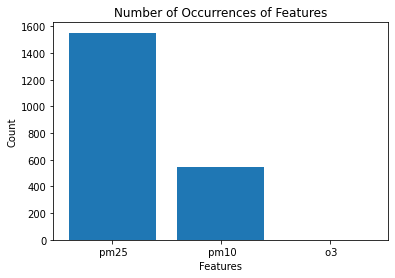

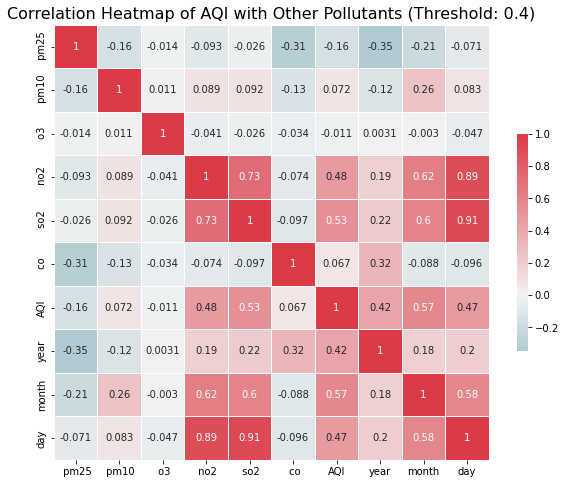

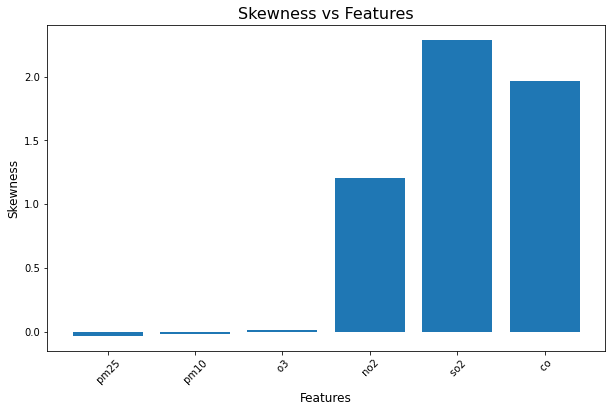

Scaled Data:
       pm25      pm10        o3       no2       so2        co       AQI  \
0  1.533631  0.999846 -1.675892 -0.085377 -0.231673 -0.743421 -0.742754   
1  1.533631  0.999846 -1.561821 -0.181145 -0.031913 -0.867893 -0.498908   
2  1.533631  0.999846 -1.447751 -0.222188  0.167847 -0.743421 -0.336344   
3  1.533631  0.999846 -1.333680 -0.140102  0.097344 -0.805657 -0.417626   
4  1.533631  0.999846 -1.219610  0.051433  0.026840 -0.930130 -0.417626   

       year     month       day  
0 -1.276974 -0.559061 -0.202695  
1 -1.276974 -0.244414 -0.283817  
2 -1.276974 -0.087091 -0.202695  
3 -1.276974 -0.244414 -0.249050  
4 -1.276974 -0.244414 -0.086808  

Correlation Matrix:
           pm25      pm10        o3       no2       so2        co       AQI  \
 pm25  1.000000 -0.161497 -0.013625 -0.092592 -0.025825 -0.313772 -0.161236   
 pm10 -0.161497  1.000000  0.011170  0.088859  0.092136 -0.130925  0.072397   
 o3   -0.013625  0.011170  1.000000 -0.041139 -0.025665 -0.033937 -0.01138

In [381]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import StandardScaler
from scipy.stats import pearsonr
from scipy.stats import skew
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense
from lime import lime_tabular
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# pusa,-delhi, delhi, india-air-quality

df = pd.read_csv("/Users/dhruv/Dhruv/sem_5/GIS/Review Paper/Research/pusa,-delhi, delhi, india-air-quality.csv", na_values=['NA', 'N/A', ' ', ''])

df['date'] = pd.to_datetime(df['date'])

# Group data by 6-month periods
df['6_month_group'] = df['date'].dt.to_period('6M')

columns_to_fill = [' pm25',' pm10', ' o3', ' no2', ' so2', ' co']  
def fill_nan_with_mean(group):
    for col in columns_to_fill:
        if group[col].isnull().sum() == len(group):
            group[col].fillna(df[col].mean(), inplace=True)
        else:
            group[col].fillna(group[col].mean(), inplace=True)
    return group

all_accuracy = []
df = df.groupby('6_month_group').apply(fill_nan_with_mean)

df.drop('6_month_group', axis=1, inplace=True)

print(df.isnull().sum())
df['AQI'] = df[columns_to_fill].max(axis=1)
print(df)

d = dict(zip(df['date'], df[columns_to_fill].idxmax(axis=1)))
feature_count = {}
for value in d.values():
    feature_count[value] = feature_count.get(value, 0) + 1

# Plotting the bar graph
plt.bar(feature_count.keys(), feature_count.values())
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Occurrences of Features')
plt.show()

df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co','AQI']])
df_scaled = pd.DataFrame(scaled_features, columns=df.columns[1:])

# Statistical Correlation
correlation_matrix = df_scaled.corr()
f, ax = plt.subplots(figsize=(10, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(correlation_matrix, cmap=cmap, vmax=1, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap of AQI with Other Pollutants (Threshold: 0.4)', fontsize=16)
plt.show()

# Skewness Identification
skewness = df_scaled.drop(['day', 'month', 'year','AQI'], axis=1).skew()

# Plotting the graph
plt.figure(figsize=(10, 6))
plt.bar(skewness.index, skewness.values)
plt.xlabel('Features', fontsize=12)
plt.ylabel('Skewness', fontsize=12)
plt.title('Skewness vs Features', fontsize=16)
plt.xticks(rotation=45)
plt.show()

# Printing the results
print("Scaled Data:")
print(df_scaled.head())

print("\nCorrelation Matrix:")
print(correlation_matrix)

print("\nSkewness:")
print(skewness)

X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the model
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions
y_pred = reg.predict(X_test)

# Model evaluation
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Model Score:', reg.score(X_test, y_test))
all_accuracy.append(reg.score(X_test, y_test))
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, reg.predict, num_features=6)
explanation.show_in_notebook()





In [382]:
# pusa,-delhi, delhi, india-air-quality

X = df[[' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize the ANN for regression
model = Sequential()
model.add(Dense(12, input_dim=6, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))  # Output layer for regression

# Compile the ANN
model.compile(loss='mean_squared_error', optimizer='adam')

# Fit the ANN to the training data
model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)  # Set verbose=1 for progress updates

# Evaluate the ANN on the testing data
# loss = model.evaluate(X_test, y_test, verbose=0)
# print('Mean Squared Error: ', loss)
loss = model.evaluate(X_test, y_test)
print(f"Test loss: {loss}")

# Create an explainer
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, model.predict, num_features=6)
explanation.show_in_notebook()

14/14 [==============================] - 0s 559us/step - loss: 0.0746
Test loss: 0.07460396736860275
157/157 [==============================] - 0s 785us/step


In [383]:
data = df.copy()


In [384]:
features = [' pm25', ' pm10', ' o3', ' no2', ' so2', ' co']
# Determine the column with the maximum value for each row and replace 'AQI'
df['AQI'] = df[features].idxmax(axis=1)
df
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['AQI'] = label_encoder.fit_transform(df['AQI'])

df

,date,pm25,pm10,o3,no2,so2,co,AQI,year,month,day
0,2023-10-01,149.000000,115.00,8.0,13.0,1.000000,8.0000,2,2023,10,1
1,2023-10-02,142.000000,132.00,6.0,16.0,1.000000,10.0000,2,2023,10,2
2,2023-10-03,139.000000,149.00,8.0,18.0,1.000000,11.0000,1,2023,10,3
3,2023-10-04,145.000000,143.00,7.0,17.0,1.000000,10.0000,2,2023,10,4
4,2023-10-05,159.000000,137.00,5.0,17.0,1.000000,10.0000,2,2023,10,5
...,...,...,...,...,...,...,...,...,...,...,...
2097,2018-06-02,149.678571,87.00,56.0,11.0,10.000000,7.0000,2,2018,6,2
2098,2017-12-31,180.200000,212.00,37.0,14.0,5.688589,11.5776,1,2017,12,31
2099,2017-11-06,209.210526,280.00,12.0,7.0,5.688589,11.5776,1,2017,11,6
2100,2017-11-13,209.210526,189.00,29.0,21.0,5.688589,11.5776,2,2017,11,13


In [385]:
X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)


all_accuracy.append(accuracy)





from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

all_accuracy.append(accuracy)








from sklearn.svm import SVC
clf = SVC(kernel='linear')

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)

print(accuracy)



all_accuracy.append(accuracy)


Accuracy: 0.9548693586698337
Accuracy: 0.9239904988123515
0.997624703087886


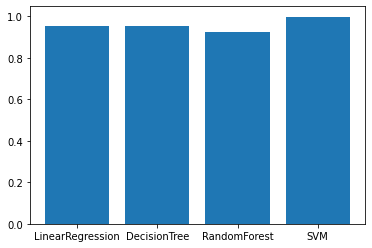

In [386]:
import matplotlib.pyplot as plt

model_name = ['LinearRegression', 'DecisionTree', 'RandomForest', 'SVM']
plt.bar(model_name, all_accuracy)
plt.show()

In [387]:
data

,date,pm25,pm10,o3,no2,so2,co,AQI,year,month,day
0,2023-10-01,149.000000,115.00,8.0,13.0,1.000000,8.0000,149.000000,2023,10,1
1,2023-10-02,142.000000,132.00,6.0,16.0,1.000000,10.0000,142.000000,2023,10,2
2,2023-10-03,139.000000,149.00,8.0,18.0,1.000000,11.0000,149.000000,2023,10,3
3,2023-10-04,145.000000,143.00,7.0,17.0,1.000000,10.0000,145.000000,2023,10,4
4,2023-10-05,159.000000,137.00,5.0,17.0,1.000000,10.0000,159.000000,2023,10,5
...,...,...,...,...,...,...,...,...,...,...,...
2097,2018-06-02,149.678571,87.00,56.0,11.0,10.000000,7.0000,149.678571,2018,6,2
2098,2017-12-31,180.200000,212.00,37.0,14.0,5.688589,11.5776,212.000000,2017,12,31
2099,2017-11-06,209.210526,280.00,12.0,7.0,5.688589,11.5776,280.000000,2017,11,6
2100,2017-11-13,209.210526,189.00,29.0,21.0,5.688589,11.5776,209.210526,2017,11,13


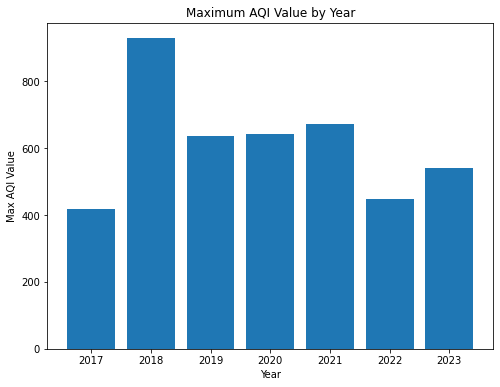

In [388]:
grouped = data.groupby('year')['AQI'].max().reset_index()

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(grouped['year'], grouped['AQI'])
plt.xlabel('Year')
plt.ylabel('Max AQI Value')
plt.title('Maximum AQI Value by Year')
plt.show()


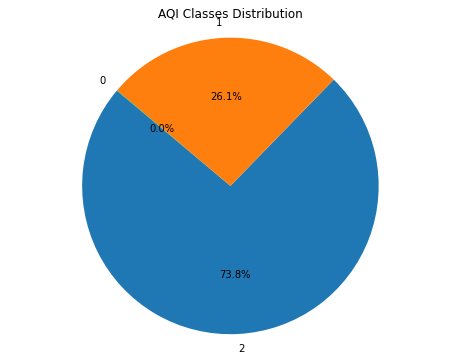

In [389]:
class_counts = df['AQI'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')

plt.title('AQI Classes Distribution')
plt.show()

date     0
 pm25    0
 pm10    0
 o3      0
 no2     0
 so2     0
 co      0
dtype: int64


/var/folders/t2/q9fs839s4l96y0sbpzp96jr40000gn/T/ipykernel_67229/802040184.py:20: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('6_month_group').apply(fill_nan_with_mean)


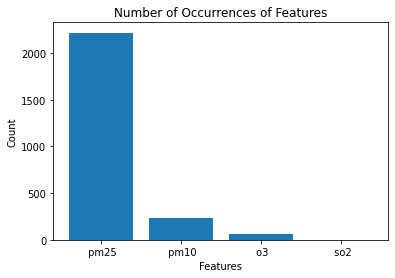

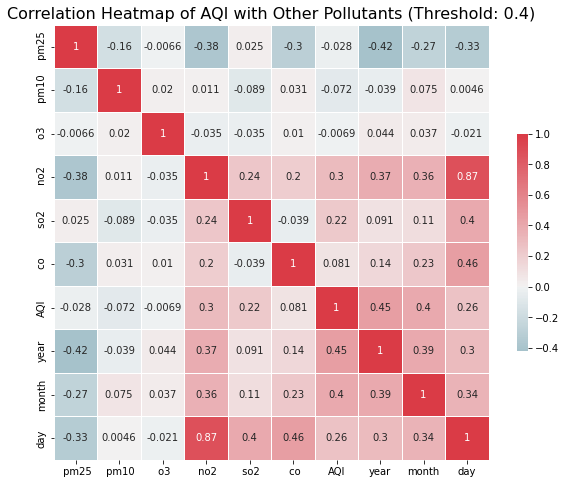

Scaled Data:
       pm25      pm10        o3       no2       so2        co       AQI  \
0  1.389268  0.985217 -1.670308  0.045858  0.000900  0.004542  0.003240   
1  1.389268  0.132508 -1.670308 -0.845208 -1.146544 -0.858529 -0.783537   
2  1.389268  0.132508 -1.556814 -1.129590 -0.763123 -0.518406 -0.672063   
3  1.389268  0.132508 -1.443320 -0.541866 -0.603364 -0.591290 -0.672063   
4  1.389268  0.132508 -1.329827 -0.731455 -0.283847 -0.542701 -0.672063   

       year     month       day  
0 -0.005441 -0.006246 -0.065086  
1 -0.183807 -0.276640 -0.900260  
2 -0.667402  0.083262 -1.166805  
3 -0.667402 -0.396607 -0.615946  
4 -0.398738 -0.396607 -0.793642  

Correlation Matrix:
           pm25      pm10        o3       no2       so2        co       AQI  \
 pm25  1.000000 -0.162762 -0.006572 -0.379078  0.025176 -0.301250 -0.028001   
 pm10 -0.162762  1.000000  0.020217  0.010667 -0.089292  0.030825 -0.072469   
 o3   -0.006572  0.020217  1.000000 -0.035047 -0.034990  0.010354 -0.00686

In [390]:
# maninagar,-ahmedabad, india-air-quality

df = pd.read_csv("/Users/dhruv/Dhruv/sem_5/GIS/Review Paper/Research/maninagar,-ahmedabad, india-air-quality.csv", na_values=['NA', 'N/A', ' ', ''])

df['date'] = pd.to_datetime(df['date'])
all_accuracy_1=[]
# Group data by 6-month periods
df['6_month_group'] = df['date'].dt.to_period('6M')

columns_to_fill = [' pm25',' pm10', ' o3', ' no2', ' so2', ' co']  
def fill_nan_with_mean(group):
    for col in columns_to_fill:
        if group[col].isnull().sum() == len(group):
            group[col].fillna(df[col].mean(), inplace=True)
        else:
            group[col].fillna(group[col].mean(), inplace=True)
    return group


df = df.groupby('6_month_group').apply(fill_nan_with_mean)

df.drop('6_month_group', axis=1, inplace=True)

print(df.isnull().sum())
df['AQI'] = df[columns_to_fill].max(axis=1)
df
d = dict(zip(df['date'], df[columns_to_fill].idxmax(axis=1)))
feature_count = {}
for value in d.values():
    feature_count[value] = feature_count.get(value, 0) + 1

# Plotting the bar graph
plt.bar(feature_count.keys(), feature_count.values())
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Occurrences of Features')
plt.show()

df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co','AQI']])
df_scaled = pd.DataFrame(scaled_features, columns=df.columns[1:])

# Statistical Correlation
correlation_matrix = df_scaled.corr()
f, ax = plt.subplots(figsize=(10, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(correlation_matrix, cmap=cmap, vmax=1, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap of AQI with Other Pollutants (Threshold: 0.4)', fontsize=16)
plt.show()

# Skewness Identification
skewness = df_scaled.skew()

# Printing the results
print("Scaled Data:")
print(df_scaled.head())

print("\nCorrelation Matrix:")
print(correlation_matrix)

print("\nSkewness:")
print(skewness)



X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the model
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions
y_pred = reg.predict(X_test)

# Model evaluation
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Model Score:', reg.score(X_test, y_test))
all_accuracy_1.append(reg.score(X_test, y_test))

explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, reg.predict, num_features=6)
explanation.show_in_notebook()

In [391]:
# maninagar,-ahmedabad, india-air-quality

X = df[[' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']

# Normalize the input features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize the ANN for regression
model = Sequential()
model.add(Dense(12, input_dim=6, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))  # Output layer for regression

# Compile the ANN
model.compile(loss='mean_squared_error', optimizer='adam')

# Fit the ANN to the training data
model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)  # Set verbose=1 for progress updates

# Evaluate the ANN on the testing data
# loss = model.evaluate(X_test, y_test, verbose=0)
# print('Mean Squared Error: ', loss)
accuracy = model.evaluate(X_test, y_test)
print(f"loss: {loss}")



# Create an explainer
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, model.predict, num_features=6)
explanation.show_in_notebook()

16/16 [==============================] - 0s 509us/step - loss: 34.4796
loss: 0.07460396736860275
157/157 [==============================] - 0s 953us/step


In [392]:
features = [' pm25', ' pm10', ' o3', ' no2', ' so2', ' co']
data = df.copy()
# Determine the column with the maximum value for each row and replace 'AQI'
df['AQI'] = df[features].idxmax(axis=1)
df
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['AQI'] = label_encoder.fit_transform(df['AQI'])

df

,date,pm25,pm10,o3,no2,so2,co,AQI,year,month,day
0,2023-10-01,137.000000,87.911765,40.525361,27.115901,23.319507,10.253897,2,2023,10,1
1,2023-07-01,90.000000,52.000000,5.000000,13.000000,20.000000,8.000000,2,2023,7,1
2,2023-07-02,75.000000,64.000000,19.000000,15.000000,11.000000,11.000000,2,2023,7,2
3,2023-07-03,106.000000,69.000000,16.000000,15.000000,11.000000,7.000000,2,2023,7,3
4,2023-07-04,96.000000,79.000000,18.000000,15.000000,16.000000,7.000000,2,2023,7,4
...,...,...,...,...,...,...,...,...,...,...,...
2509,2017-10-17,169.571429,87.911765,43.285714,59.000000,41.000000,2.000000,2,2017,10,17
2510,2016-07-13,105.875000,87.911765,12.500000,45.000000,27.000000,10.000000,2,2016,7,13
2511,2016-07-24,105.875000,87.911765,12.500000,43.000000,27.000000,10.000000,2,2016,7,24
2512,2015-11-02,219.200000,87.911765,51.333333,11.000000,20.000000,9.000000,2,2015,11,2


In [393]:
X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
all_accuracy_1.append(accuracy)







from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
all_accuracy_1.append(accuracy)









from sklearn.svm import SVC
clf = SVC(kernel='linear')

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
all_accuracy_1.append(accuracy)

print(accuracy)


Accuracy: 0.9602385685884692
Accuracy: 0.9562624254473161
0.9880715705765407


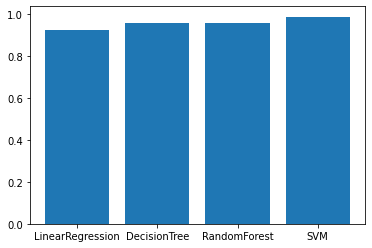

In [394]:
plt.bar(model_name, all_accuracy_1)
plt.show()
# all_accuracy_1

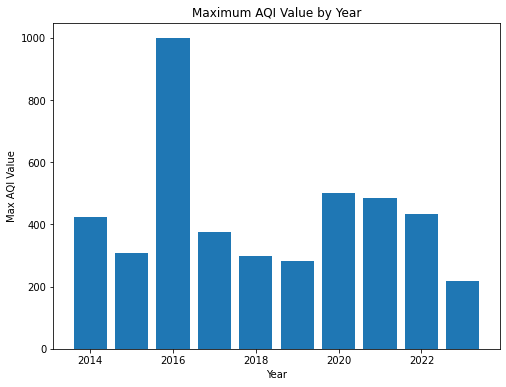

In [395]:
grouped = data.groupby('year')['AQI'].max().reset_index()

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(grouped['year'], grouped['AQI'])
plt.xlabel('Year')
plt.ylabel('Max AQI Value')
plt.title('Maximum AQI Value by Year')
plt.show()


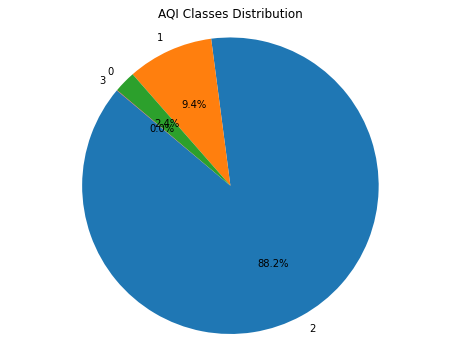

In [396]:
class_counts = df['AQI'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')

plt.title('AQI Classes Distribution')
plt.show()

date     0
 pm25    0
 pm10    0
 o3      0
 no2     0
 so2     0
 co      0
dtype: int64


/var/folders/t2/q9fs839s4l96y0sbpzp96jr40000gn/T/ipykernel_67229/4141232478.py:20: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('6_month_group').apply(fill_nan_with_mean)


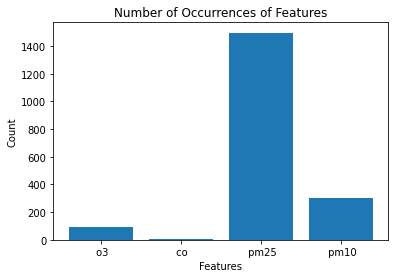

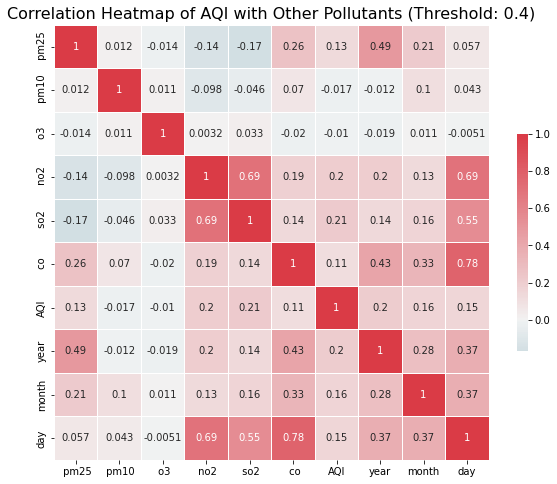

Scaled Data:
       pm25      pm10        o3       no2       so2        co       AQI  \
0  1.402635  1.020089 -1.659838  0.271824  0.178637  2.865970 -0.774178   
1  1.402635  1.020089 -1.546122  0.271824  0.178637  3.532055 -0.774178   
2  1.402635  1.020089 -1.432407  0.271824  0.178637  7.219893 -0.039862   
3  1.402635  1.020089  1.637909  0.271824  0.147616  1.809981 -0.039862   
4  1.402635  1.020089  1.751625  0.271824  0.147616  1.988687  0.494186   

       year     month       day  
0  0.359479 -0.736021  1.643326  
1  0.513640 -0.736021  2.317510  
2  0.821964 -0.736021  6.050188  
3  2.980230 -0.736021  0.574497  
4  3.288553 -0.736021  0.755376  

Correlation Matrix:
           pm25      pm10        o3       no2       so2        co       AQI  \
 pm25  1.000000  0.011617 -0.013794 -0.138559 -0.166797  0.259380  0.126177   
 pm10  0.011617  1.000000  0.011134 -0.098035 -0.045538  0.069575 -0.016550   
 o3   -0.013794  0.011134  1.000000  0.003239  0.033423 -0.020165 -0.01045

In [397]:
# bandra,-mumbai, india-air-quality

df = pd.read_csv("/Users/dhruv/Dhruv/sem_5/GIS/Review Paper/Research/bandra,-mumbai, india-air-quality.csv", na_values=['NA', 'N/A', ' ', ''])

df['date'] = pd.to_datetime(df['date'])
all_accuracy_2=[]
# Group data by 6-month periods
df['6_month_group'] = df['date'].dt.to_period('6M')

columns_to_fill = [' pm25',' pm10', ' o3', ' no2', ' so2', ' co']  
def fill_nan_with_mean(group):
    for col in columns_to_fill:
        if group[col].isnull().sum() == len(group):
            group[col].fillna(df[col].mean(), inplace=True)
        else:
            group[col].fillna(group[col].mean(), inplace=True)
    return group


df = df.groupby('6_month_group').apply(fill_nan_with_mean)

df.drop('6_month_group', axis=1, inplace=True)

print(df.isnull().sum())
df['AQI'] = df[columns_to_fill].max(axis=1)
df

d = dict(zip(df['date'], df[columns_to_fill].idxmax(axis=1)))
feature_count = {}
for value in d.values():
    feature_count[value] = feature_count.get(value, 0) + 1

# Plotting the bar graph
plt.bar(feature_count.keys(), feature_count.values())
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Occurrences of Features')
plt.show()

df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co','AQI']])
df_scaled = pd.DataFrame(scaled_features, columns=df.columns[1:])

# Statistical Correlation
correlation_matrix = df_scaled.corr()
f, ax = plt.subplots(figsize=(10, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(correlation_matrix, cmap=cmap, vmax=1, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap of AQI with Other Pollutants (Threshold: 0.4)', fontsize=16)
plt.show()

# Skewness Identification
skewness = df_scaled.skew()

# Printing the results
print("Scaled Data:")
print(df_scaled.head())

print("\nCorrelation Matrix:")
print(correlation_matrix)

print("\nSkewness:")
print(skewness)



X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the model
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions
y_pred = reg.predict(X_test)

# Model evaluation
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Model Score:', reg.score(X_test, y_test))
all_accuracy_2.append(reg.score(X_test, y_test))

explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, reg.predict, num_features=6)
explanation.show_in_notebook()

In [398]:
# bandra,-mumbai, india-air-quality

X = df[[' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']

# Normalize the input features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize the ANN for regression
model = Sequential()
model.add(Dense(12, input_dim=6, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))  # Output layer for regression

# Compile the ANN
model.compile(loss='mean_squared_error', optimizer='adam')

# Fit the ANN to the training data
model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)  # Set verbose=1 for progress updates

# Evaluate the ANN on the testing data
# loss = model.evaluate(X_test, y_test, verbose=0)
# print('Mean Squared Error: ', loss)
loss = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {loss}")


# Create an explainer
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, model.predict, num_features=6)
explanation.show_in_notebook()

12/12 [==============================] - 0s 1ms/step - loss: 2.6403
Test Accuracy: 2.640331506729126
157/157 [==============================] - 0s 703us/step


In [399]:
features = [' pm25', ' pm10', ' o3', ' no2', ' so2', ' co']
data = df.copy()
# Determine the column with the maximum value for each row and replace 'AQI'
df['AQI'] = df[features].idxmax(axis=1)
df
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['AQI'] = label_encoder.fit_transform(df['AQI'])

df

,date,pm25,pm10,o3,no2,so2,co,AQI,year,month,day
0,2021-10-01,107.000000,76.0,206.0,3.000000,11.0,1.0,1,2021,10,1
1,2021-10-02,107.000000,76.0,247.0,3.000000,12.0,1.0,1,2021,10,2
2,2021-10-03,107.000000,76.0,474.0,9.947368,14.0,1.0,1,2021,10,3
3,2021-10-30,107.000000,75.0,141.0,9.947368,28.0,1.0,1,2021,10,30
4,2021-10-31,107.000000,75.0,152.0,15.000000,30.0,1.0,1,2021,10,31
...,...,...,...,...,...,...,...,...,...,...,...
1893,2020-12-03,49.833333,78.5,4.0,10.611402,7.0,15.0,2,2020,12,3
1894,2020-12-04,49.833333,78.5,4.0,10.611402,7.0,17.0,2,2020,12,4
1895,2020-12-13,49.833333,78.5,4.0,10.611402,7.0,14.0,2,2020,12,13
1896,2020-12-14,49.833333,78.5,4.0,10.611402,7.0,13.0,2,2020,12,14


In [400]:
X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)

print("Accuracy:", accuracy)
all_accuracy_2.append(accuracy)







from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
all_accuracy_2.append(accuracy)









from sklearn.svm import SVC
clf = SVC(kernel='linear')

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
all_accuracy_2.append(accuracy)

print(accuracy)


Accuracy: 0.9710526315789474
Accuracy: 0.9552631578947368
0.9947368421052631


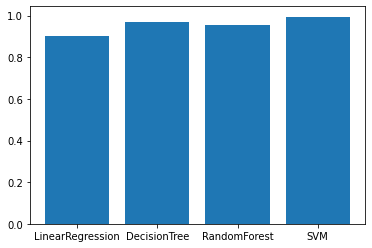

In [401]:
plt.bar(model_name, all_accuracy_2)
plt.show()

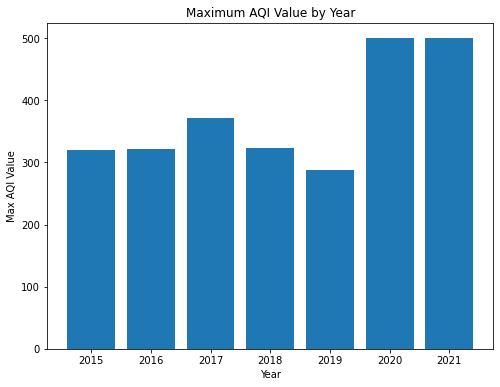

In [402]:
grouped = data.groupby('year')['AQI'].max().reset_index()

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(grouped['year'], grouped['AQI'])
plt.xlabel('Year')
plt.ylabel('Max AQI Value')
plt.title('Maximum AQI Value by Year')
plt.show()


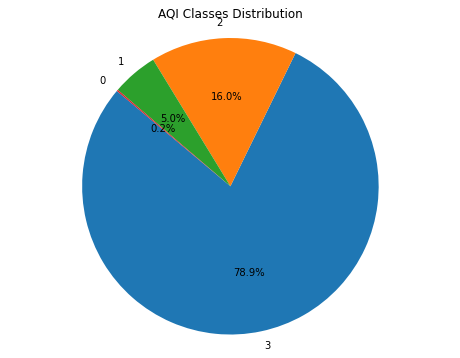

In [403]:
class_counts = df['AQI'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')

plt.title('AQI Classes Distribution')
plt.show()

date     0
 pm25    0
 pm10    0
 o3      0
 no2     0
 so2     0
 co      0
dtype: int64


/var/folders/t2/q9fs839s4l96y0sbpzp96jr40000gn/T/ipykernel_67229/2195342842.py:20: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  df = df.groupby('6_month_group').apply(fill_nan_with_mean)


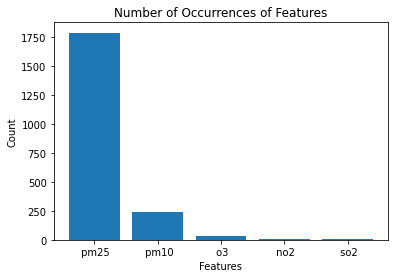

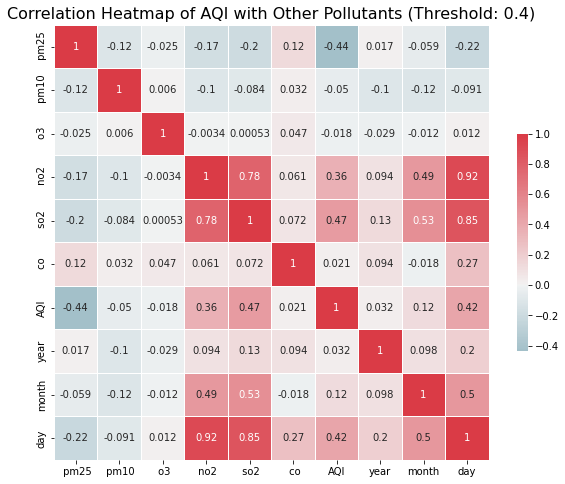

Scaled Data:
       pm25      pm10        o3       no2       so2        co       AQI  \
0  1.400986  1.035808 -1.669693 -1.586763 -1.116141 -0.720126 -0.792243   
1  1.400986  1.035808 -1.556015 -1.451478 -1.224814 -0.757323 -0.792243   
2  1.400986  1.035808 -1.442336 -1.637494 -1.162715 -0.720126 -0.717946   
3  1.400986  1.035808 -1.328658 -1.671316 -0.681450 -0.757323 -0.717946   
4  1.400986  1.035808 -1.214980 -0.944161 -0.619351 -0.757323 -0.717946   

       year     month       day  
0 -0.499384 -0.521068 -1.530648  
1 -0.411825 -0.521068 -1.408942  
2 -0.499384 -0.521068 -1.576288  
3 -0.499384 -0.058148 -1.363302  
4 -0.411825 -0.058148 -0.952544  

Correlation Matrix:
           pm25      pm10        o3       no2       so2        co       AQI  \
 pm25  1.000000 -0.115314 -0.025150 -0.174172 -0.196705  0.124836 -0.436521   
 pm10 -0.115314  1.000000  0.005998 -0.101143 -0.083646  0.032246 -0.050028   
 o3   -0.025150  0.005998  1.000000 -0.003351  0.000531  0.047034 -0.01751

In [404]:
# rabindra-bharati university, kolkata, india-air-quality

df = pd.read_csv("/Users/dhruv/Dhruv/sem_5/GIS/Review Paper/Research/rabindra-bharati university, kolkata, india-air-quality.csv", na_values=['NA', 'N/A', ' ', ''])
all_accuracy_3 = []
df['date'] = pd.to_datetime(df['date'])

# Group data by 6-month periods
df['6_month_group'] = df['date'].dt.to_period('6M')

columns_to_fill = [' pm25',' pm10', ' o3', ' no2', ' so2', ' co']  
def fill_nan_with_mean(group):
    for col in columns_to_fill:
        if group[col].isnull().sum() == len(group):
            group[col].fillna(df[col].mean(), inplace=True)
        else:
            group[col].fillna(group[col].mean(), inplace=True)
    return group


df = df.groupby('6_month_group').apply(fill_nan_with_mean)

df.drop('6_month_group', axis=1, inplace=True)

print(df.isnull().sum())
df['AQI'] = df[columns_to_fill].max(axis=1)
df

d = dict(zip(df['date'], df[columns_to_fill].idxmax(axis=1)))
feature_count = {}
for value in d.values():
    feature_count[value] = feature_count.get(value, 0) + 1

# Plotting the bar graph
plt.bar(feature_count.keys(), feature_count.values())
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Number of Occurrences of Features')
plt.show()

df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.month
df['day'] = df['date'].dt.day

scaler = StandardScaler()
scaled_features = scaler.fit_transform(df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co','AQI']])
df_scaled = pd.DataFrame(scaled_features, columns=df.columns[1:])

# Statistical Correlation
correlation_matrix = df_scaled.corr()
f, ax = plt.subplots(figsize=(10, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(correlation_matrix, cmap=cmap, vmax=1, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap of AQI with Other Pollutants (Threshold: 0.4)', fontsize=16)
plt.show()

# Skewness Identification
skewness = df_scaled.skew()

# Printing the results
print("Scaled Data:")
print(df_scaled.head())

print("\nCorrelation Matrix:")
print(correlation_matrix)

print("\nSkewness:")
print(skewness)



X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Train the model
reg = LinearRegression()
reg.fit(X_train, y_train)

# Make predictions
y_pred = reg.predict(X_test)

# Model evaluation
print('Mean Squared Error:', mean_squared_error(y_test, y_pred))
print('Model Score:', reg.score(X_test, y_test))
all_accuracy_3.append(reg.score(X_test, y_test))
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, reg.predict, num_features=6)
explanation.show_in_notebook()

In [405]:
# rabindra-bharati university, kolkata, india-air-quality

X = df[[' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']

# Normalize the input features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Initialize the ANN for regression
model = Sequential()
model.add(Dense(12, input_dim=6, activation='relu'))
model.add(Dense(8, activation='relu'))
model.add(Dense(1))  # Output layer for regression

# Compile the ANN
model.compile(loss='mean_squared_error', optimizer='adam')

# Fit the ANN to the training data
model.fit(X_train, y_train, epochs=150, batch_size=10, verbose=0)  # Set verbose=1 for progress updates

# Evaluate the ANN on the testing data
# loss = model.evaluate(X_test, y_test, verbose=0)
# print('Mean Squared Error: ', loss)
loss = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {loss}")


# Create an explainer
explainer = lime_tabular.LimeTabularExplainer(X_train, feature_names=X.columns, class_names=['AQI'], mode='regression')

# Choose a data point to explain
data_point_to_explain = X_test[0]

# Explain the prediction
explanation = explainer.explain_instance(data_point_to_explain, model.predict, num_features=6)
explanation.show_in_notebook()

13/13 [==============================] - 0s 2ms/step - loss: 2.8837
Test Accuracy: 2.883713483810425
157/157 [==============================] - 0s 916us/step


In [406]:
features = [' pm25', ' pm10', ' o3', ' no2', ' so2', ' co']
data = df.copy()
# Determine the column with the maximum value for each row and replace 'AQI'
df['AQI'] = df[features].idxmax(axis=1)
df
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['AQI'] = label_encoder.fit_transform(df['AQI'])

df

,date,pm25,pm10,o3,no2,so2,co,AQI,year,month,day
0,2023-10-01,41.000000,24.00000,6.0,3.0,2.000000,3.0,3,2023,10,1
1,2023-10-02,49.000000,17.00000,5.0,3.0,3.000000,3.0,3,2023,10,2
2,2023-10-03,38.000000,21.00000,6.0,4.0,2.000000,3.0,3,2023,10,3
3,2023-10-04,36.000000,52.00000,5.0,4.0,2.000000,5.0,2,2023,10,4
4,2023-10-05,79.000000,56.00000,5.0,4.0,3.000000,5.0,3,2023,10,5
...,...,...,...,...,...,...,...,...,...,...,...
2068,2016-10-17,135.166172,89.00000,16.0,7.0,7.853333,9.0,3,2016,10,17
2069,2016-10-27,135.166172,89.00000,24.0,14.0,7.853333,6.0,3,2016,10,27
2070,2016-10-29,135.166172,89.00000,8.0,23.0,7.853333,9.0,3,2016,10,29
2071,2016-11-21,135.166172,143.68000,13.0,53.0,7.853333,11.0,2,2016,11,21


In [407]:
X = df[['year', 'month', 'day',' pm25',' pm10', ' o3', ' no2', ' so2', ' co']]
y = df['AQI']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)



from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
all_accuracy_3.append(accuracy)
print("Accuracy:", accuracy)








from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
all_accuracy_3.append(accuracy)

print("Accuracy:", accuracy)









from sklearn.svm import SVC
clf = SVC(kernel='linear')

clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
all_accuracy_3.append(accuracy)

print(accuracy)


Accuracy: 0.9686746987951808
Accuracy: 0.9518072289156626
0.9783132530120482


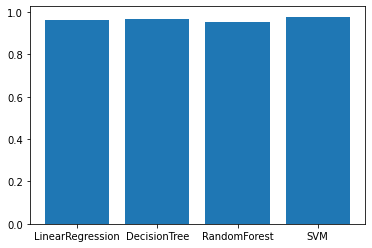

In [408]:
plt.bar(model_name, all_accuracy_3)
plt.show()

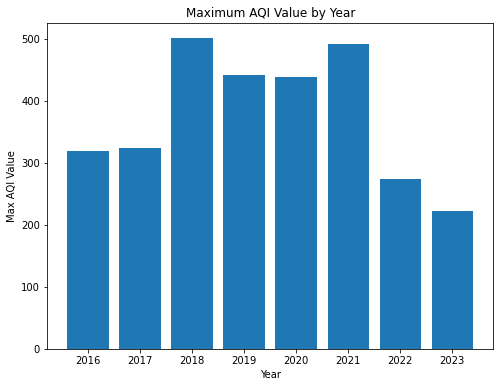

In [409]:
grouped = data.groupby('year')['AQI'].max().reset_index()

# Create a bar plot
plt.figure(figsize=(8, 6))
plt.bar(grouped['year'], grouped['AQI'])
plt.xlabel('Year')
plt.ylabel('Max AQI Value')
plt.title('Maximum AQI Value by Year')
plt.show()


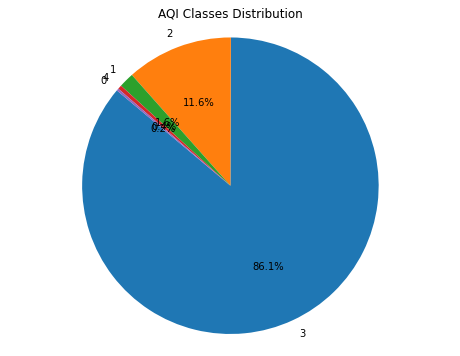

In [410]:
class_counts = df['AQI'].value_counts()

plt.figure(figsize=(8, 6))
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', startangle=140)
plt.axis('equal')

plt.title('AQI Classes Distribution')
plt.show()